# FPP multi-objective optimization

## Import packages

In [1]:
using Revise
using FUSE
using Plots

## Set baseline `ini` and `act`

In [2]:
ini, act = FUSE.case_parameters(:FPP, version=:v1_demount, init_from=:scalars);

In [3]:
ini.equilibrium.ϵ = 1/3.5
ini.equilibrium.κ = 0.8826 # set less than one so that init uses this as the f_kappa parameter
ini.equilibrium.δ = 0.7
ini.equilibrium.ζ = 0.0
ini.equilibrium.pressure_core = 1.5e6

delete!(ini.build.layers,:hfs_vacuum_vessel_wall_inner)
delete!(ini.build.layers,:hfs_vacuum_vessel_wall_outer)
delete!(ini.build.layers,:lfs_vacuum_vessel_wall_inner)
delete!(ini.build.layers,:lfs_vacuum_vessel_wall_outer)

ini.core_profiles.impurity = :Kr
ini.core_profiles.n_shaping = 2.5
ini.core_profiles.T_shaping = 2.5
ini.core_profiles.T_ratio = 0.825
ini.core_profiles.greenwald_fraction = 1.0
ini.core_profiles.ne_ped = missing
ini.core_profiles.greenwald_fraction_ped = 0.7
ini.core_profiles.helium_fraction = 0.04

ini.build.plasma_gap = 0.125
ini.equilibrium.xpoints = :lower
ini.build.divertors = :lower
ini.build.symmetric = false

ini.ec_launchers.power_launched = 25e6

ini.pf_active.n_coils_outside = 8

ini.requirements.flattop_duration = 1*3600.0

3600.0

In [4]:
act.ActorEquilibrium.model = :Solovev
act.ActorEquilibrium.symmetrize = false

act.ActorPedestal.update_core_profiles = false
act.ActorPedestal.only_powerlaw = false
act.ActorPedestal.T_ratio_pedestal = 1.0

act.ActorHFSsizing.do_plot = false
act.ActorHFSsizing.verbose = false
act.ActorHFSsizing.j_tolerance = 0.5
act.ActorHFSsizing.stress_tolerance = 0.01
act.ActorHFSsizing.aspect_ratio_tolerance = 0.0
act.ActorFluxSwing.operate_oh_at_j_crit = false

act.ActorPFcoilsOpt.do_plot = false
act.ActorPFcoilsOpt.update_equilibrium = false
act.ActorPFcoilsOpt.optimization_scheme = :none

act.ActorPowerNeeds.model = :thermal_power_fraction
act.ActorPowerNeeds.thermal_power_fraction = 0.2

act.ActorThermalCycle.power_cycle_type = :fixed_cycle_efficiency
act.ActorThermalCycle.fixed_cycle_efficiency = 0.4

act.ActorStabilityLimits.raise_on_breach = false
act.ActorStabilityLimits.models = [:beta_troyon_1984, :model_201, :model_401] # include βn check

act.ActorCosting.model = :Sheffield
act.ActorCosting.production_increase = 10.0
act.ActorCosting.learning_rate = 0.616

act.ActorFixedProfiles.T_shaping = ini.core_profiles.T_shaping
act.ActorFixedProfiles.n_shaping = ini.core_profiles.n_shaping
act.ActorFixedProfiles.T_ratio_pedestal = 1.0
act.ActorFixedProfiles.T_ratio_core = ini.core_profiles.T_ratio

act.ActorCoreTransport.model = :FixedProfiles

act.ActorEquilibriumTransport.do_plot = true
act.ActorEquilibriumTransport.convergence_error = 1e-2

0.01

## Explore sensitivity to changes in `ini` and `act`

In [5]:
ini.equilibrium.B0 = 5.5
ini.equilibrium.ip = 8e6
ini.equilibrium.R0 = 5.0
ini.core_profiles.greenwald_fraction = 1.2
ini.core_profiles.greenwald_fraction_ped = 0.85
ini.equilibrium.pressure_core = 1.5e6

act.ActorHFSsizing.do_plot = true
act.ActorHFSsizing.verbose = true
act.ActorEquilibrium.model = :CHEASE
act.ActorCHEASE.rescale_eq_to_ip = false

false

## Set ini values and ranges for optimizer

In [6]:
# nominal value and ranges
ini.ec_launchers.power_launched = ini.ec_launchers.power_launched[1] ↔ [1e6, 200e6];
ini.core_profiles.greenwald_fraction = ini.core_profiles.greenwald_fraction ↔ [0.86, 1.3]
ini.core_profiles.greenwald_fraction_ped = ini.core_profiles.greenwald_fraction_ped ↔ [0.1, 0.85]
ini.equilibrium.B0 = ini.equilibrium.B0 ↔ [1.0, 20.0]
ini.equilibrium.ip = ini.equilibrium.ip ↔ [1.0e6, 22e6]
ini.equilibrium.R0 = ini.equilibrium.R0 ↔ [1.0, 15.0]
ini.equilibrium.pressure_core = ini.equilibrium.pressure_core ↔ [0.1e6, 3.0e6];
ini.requirements.ne_peaking = 1.5;
ini.requirements.q_pol_omp = 2.75e9;
ini.requirements.lh_power_threshold_fraction = 1.0;
ini.requirements.ds03 = 1.0;
ini.requirements.βn = 3.5;

## Run optimization workflow function

Jtor0_before = 0.41 MA
P0_before = 1686.98 kPa
βn_MHD = 5.06
βn_tot = 4.75
Te_ped = 3.02e+03 eV
rho_ped = 0.9500

Jtor0_after = 0.84 MA
P0_after = 1686.99 kPa
βn_MHD = 4.91
βn_tot = 4.58
Te_ped = 2.38e+03 eV
rho_ped = 0.9152


[ Info: Iteration = 1 , convergence error = 0.1498, threshold = 0.01



Jtor0_after = 0.99 MA
P0_after = 1686.99 kPa
βn_MHD = 4.65
βn_tot = 4.56
Te_ped = 2.44e+03 eV
rho_ped = 0.9141


[ Info: Iteration = 2 , convergence error = 0.06111, threshold = 0.01



Jtor0_after = 0.93 MA
P0_after = 1686.99 kPa
βn_MHD = 4.73
βn_tot = 4.57
Te_ped = 2.45e+03 eV
rho_ped = 0.9139


[ Info: Iteration = 3 , convergence error = 0.0205, threshold = 0.01



Jtor0_after = 0.95 MA
P0_after = 1686.99 kPa
βn_MHD = 4.71
βn_tot = 4.56
Te_ped = 2.45e+03 eV
rho_ped = 0.9139


[ Info: Iteration = 4 , convergence error = 0.00561, threshold = 0.01


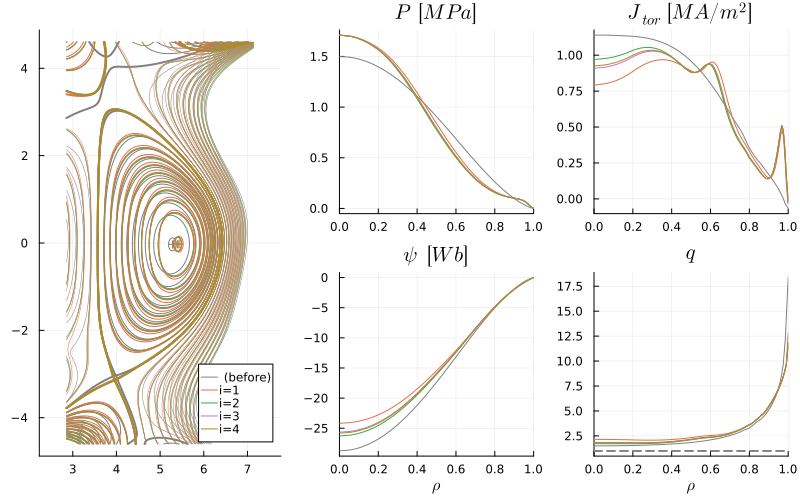

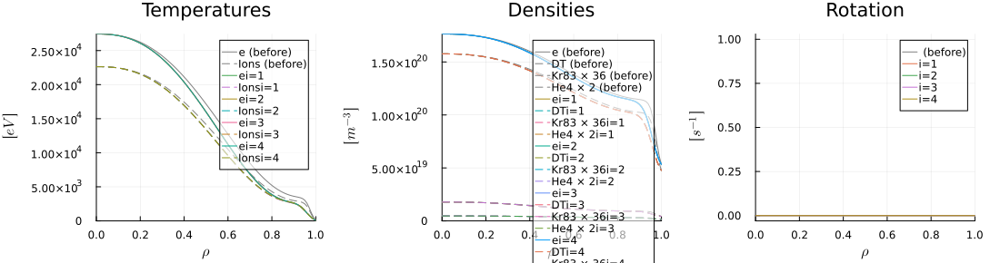

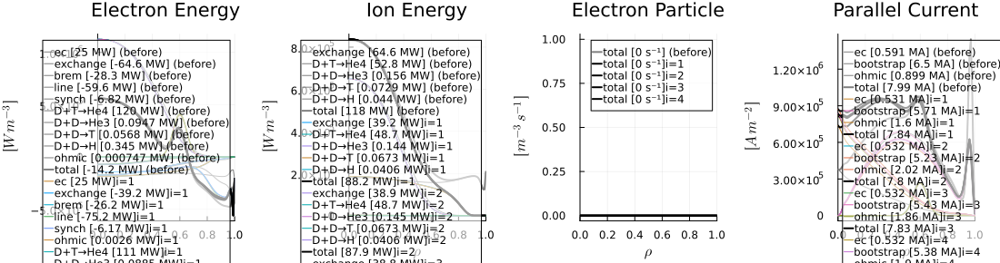

268.335472 seconds (594.46 M allocations: 25.621 GiB, 2.13% gc time, 0.04% compilation time)


In [13]:
function my_workflow(ini::FUSE.ParametersInits, act::FUSE.ParametersActors)
    
    ### modify ini layers

    R0 = ini.equilibrium.R0
    ϵ = ini.equilibrium.ϵ
    a = R0 * ϵ

    RiPlasma = R0 - a

    # HFS layers

    ini.build.layers[:plasma] = 2*a*(1+ini.build.plasma_gap)
    ini.build.layers[:hfs_first_wall] = 0.02
    ini.build.layers[:hfs_blanket] = 0.55*((1/ϵ-1.8)/2.2)^0.5
    ini.build.layers[:hfs_high_temp_shield] = RiPlasma*0.05
    ini.build.layers[:hfs_gap_high_temp_shield_vacuum_vessel] = RiPlasma * 0.02
    ini.build.layers[:hfs_vacuum_vessel] = RiPlasma * 0.05
    ini.build.layers[:hfs_gap_vacuum_vessel_low_temp_shield] = RiPlasma * 0.02
    ini.build.layers[:hfs_low_temp_shield] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
    ini.build.layers[:hfs_gap_low_temp_shield_TF] = RiPlasma * 0.02

    rbCenterPost = (R0 - 0.5*ini.build.layers[:plasma] - ini.build.layers[:hfs_first_wall] - ini.build.layers[:hfs_blanket]
        - ini.build.layers[:hfs_high_temp_shield] - ini.build.layers[:hfs_gap_high_temp_shield_vacuum_vessel]
        - ini.build.layers[:hfs_vacuum_vessel] - ini.build.layers[:hfs_gap_vacuum_vessel_low_temp_shield]
        - ini.build.layers[:hfs_low_temp_shield] - ini.build.layers[:hfs_gap_low_temp_shield_TF]);

    ini.build.layers[:hfs_TF] = rbCenterPost * 0.25
    ini.build.layers[:OH] = rbCenterPost * 0.25
    ini.build.layers[:gap_TF_OH] = RiPlasma * 0.02
    ini.build.layers[:gap_OH] = rbCenterPost - ini.build.layers[:hfs_TF] - ini.build.layers[:gap_TF_OH] - ini.build.layers[:OH]

    # LFS layers

    ini.build.layers[:lfs_first_wall] = 0.02
    ini.build.layers[:lfs_blanket] = 1.0 - 0.25*((1/ϵ-2.1)/1.9)^0.5
    ini.build.layers[:lfs_high_temp_shield] = RiPlasma * 0.05
    ini.build.layers[:lfs_gap_high_temp_shield_vacuum_vessel] = RiPlasma * 0.2
    ini.build.layers[:lfs_vacuum_vessel] = RiPlasma * 0.05
    ini.build.layers[:lfs_gap_vacuum_vessel_low_temp_shield] = RiPlasma * 0.02
    ini.build.layers[:lfs_low_temp_shield] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
    ini.build.layers[:lfs_gap_low_temp_shield_TF] = RiPlasma * 0.02
    ini.build.layers[:lfs_TF] = ini.build.layers[:hfs_TF]

    ### run init
    dd = FUSE.init(ini, act)

    ### run main compound actor
    
    # stand-alone EquilibriumTransport to check core convergence
    FUSE.ActorEquilibriumTransport(dd, act);
    
    # or full WholeFacility to run through entire workflow
    #FUSE.ActorWholeFacility(dd, act)
    
    return dd

end

@time dd = my_workflow(ini, act);


## Run digest

GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 5 [m]                     B0 → 5.5 [T]                   Te0 → 26 [keV]                 ne0 → 1.86e+20 [m⁻³]           
a → 1.43 [m]                   ip → 8 [MA]                    Ti0 → 21.5 [keV]               ne_ped → 1.06e+20 [m⁻³]        
1/ϵ → 3.5 [m]                  q95 → 6                        <Te> → 10.8 [keV]              <ne> → 1.36e+20 [m⁻³]          
κ → 2.15                       <Bpol> → 0.669 [T]             <Ti> → 9.22 [keV]              ne0/<ne> → 1.37                
δ → 0.7                        βpol_MHD → 2.89                Te0/<Te> → 2.4                 fGW → 1.24                     
ζ → -0.0623                    βtor_MHD → 0.0455              Ti0/<Ti> → 2.33                zeff_ped → 2                   


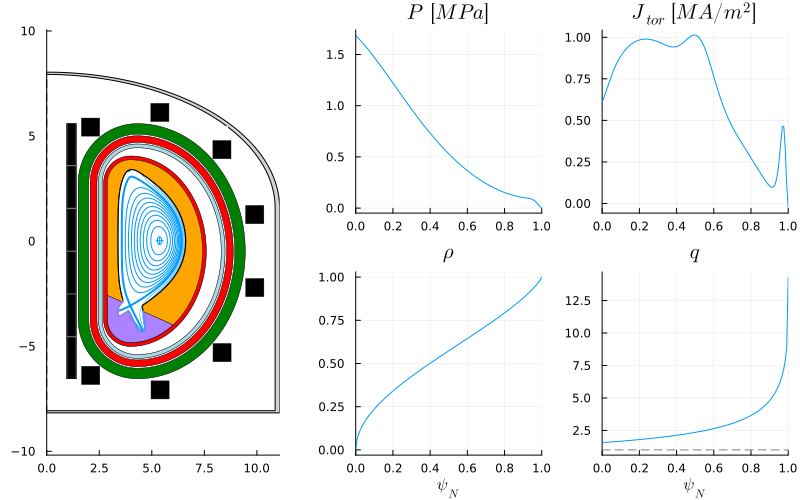

​


24×9 DataFrame
 Row │ group   details     type      ΔR         R_start    R_end      material      area       volume     
     │ String  String      String    Float64    Float64    Float64    String        Float64    Float64    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            0.928652    0.0        0.928652                11.268       32.8738
   2 │ in                  oh        0.500047    0.928652   1.4287    ReBCO          6.06742     44.9344
   3 │ in                            0.0714421   1.4287     1.50014                  0.866858     7.97615
   4 │ hfs                 tf        0.500047    1.50014    2.00019   ReBCO         15.7006     197.318
   5 │ hfs                           0.0714421   2.00019    2.07163                  2.12979     67.9984
   6 │ hfs     low temp    shield    0.318203    2.07163    2.38983   Steel          9.02877    288.886
   7 │ hfs                         

​


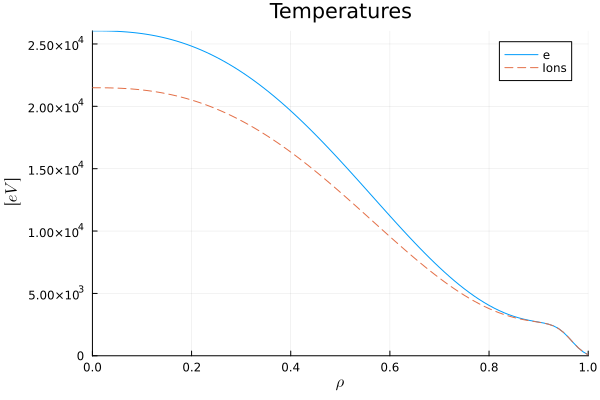

​


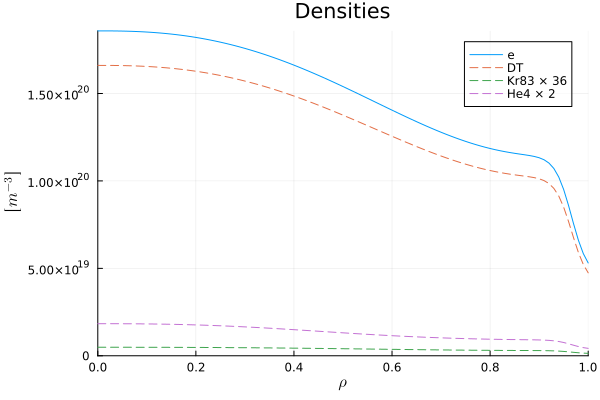

​


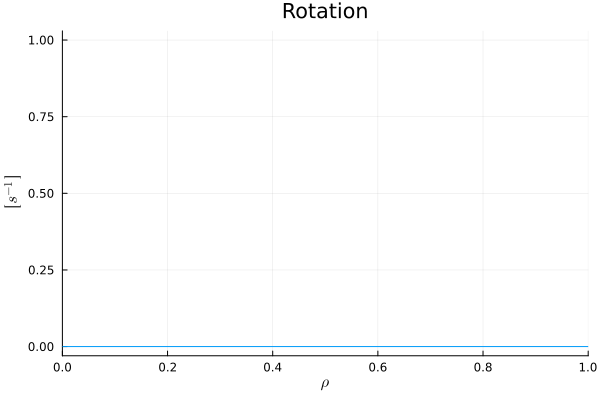

​


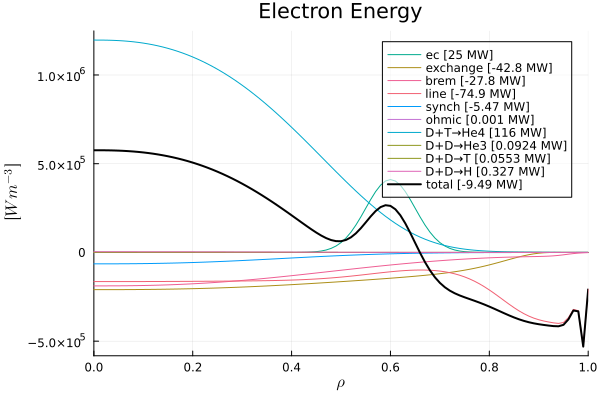

​


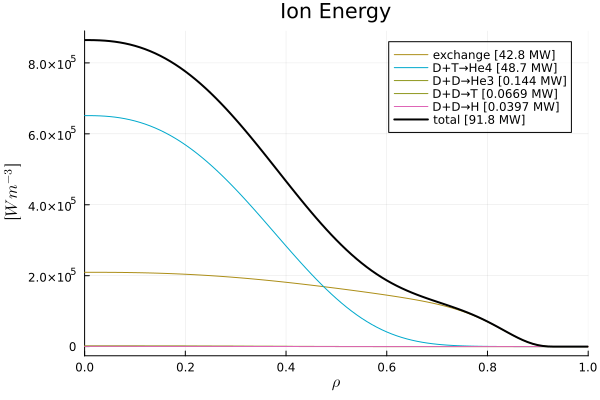

​


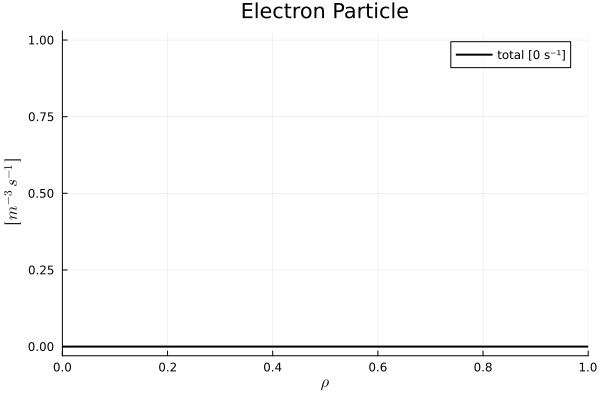

​


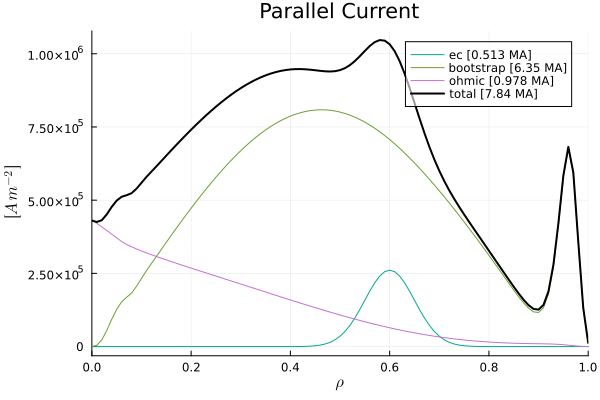

In [12]:
FUSE.digest(dd)

## Check optimization_workflow 

In [9]:
# FUSE comes with a library of objective and constraints functions
OFL = deepcopy(FUSE.ObjectiveFunctionsLibrary)
CFL = deepcopy(FUSE.ConstraintFunctionsLibrary)

objectives_functions = [OFL[:min_capital_cost], OFL[:min_R0]]
constraints_functions = [CFL[:max_βn], CFL[:min_required_power_electric_net], CFL[:max_ne_peaking], CFL[:max_ωpe_ωce], CFL[:min_lh_power_threshold], CFL[:max_qpol_omp], CFL[:max_ds03]]
println("== OBJECTIVE FUNCTIONS ==")
display(objectives_functions)
println()
println("== CONSTRAINT FUNCTIONS ==")
display(constraints_functions)

== OBJECTIVE FUNCTIONS ==


2-element Vector{FUSE.ObjectiveFunction}:
 min_capital_cost → -Inf [$B]
 min_R0 → -Inf [m]


== CONSTRAINT FUNCTIONS ==


7-element Vector{FUSE.ConstraintFunction}:
 max_βn < 0.0 [%]
 min_required_power_electric_net > 0.0 [%]
 max_ne_peaking < 0.0 [%]
 max_ωpe_ωce < 1.0 [%]
 min_lh_power_threshold > 0.0 [%]
 max_qpol_omp < 0.0 [%]
 max_ds03 < 0.0 [%]

In [10]:
import SimulationParameters: opt_parameters, float_bounds

# itentify optimization variables in ini
opt_ini = opt_parameters(ini)
println("== Actuators ==")
for optpar in opt_ini
    println(optpar)
end
println()
println("== Objectives ==")
for objf in objectives_functions
    println(objf)
end
println()
println("== Constraints ==")
for cnst in constraints_functions
    println(cnst)
end

# optimization boundaries
bounds = [[float_bounds(optpar)[1] for optpar in opt_ini] [float_bounds(optpar)[2] for optpar in opt_ini]]'


== Actuators ==
ini.equilibrium.B0
- units: T
- description: Vacuum toroidal field at R0 [T]; Positive sign means anti-clockwise when viewing from above. The product R0B0 must be consistent with the b_tor_vacuum_r field of the tf IDS.
- value: 5.5
- base: 4.713171689711136
- default: missing
- opt: SimulationParameters.OptParameterRange{Float64}(5.5, 1.0, 20.0, Missing[])
ini.equilibrium.R0
- units: m
- description: Geometric genter of the plasma. NOTE: This also scales the radial build layers.
- value: 5.0
- base: 4.824432302041749
- default: missing
- opt: SimulationParameters.OptParameterRange{Float64}(5.0, 1.0, 15.0, Missing[])
ini.equilibrium.pressure_core
- units: Pa
- description: On axis pressure
- value: 1.5e6
- base: 1.5587652064765713e6
- default: missing
- opt: SimulationParameters.OptParameterRange{Float64}(1.5e6, 100000.0, 3.0e6, Missing[])
ini.equilibrium.ip
- units: A
- description: Plasma current (toroidal component). Positive sign means anti-clockwise when viewed from

2×7 adjoint(::Matrix{Float64}) with eltype Float64:
  1.0   1.0  100000.0    1.0e6  0.86  0.1   1.0e6
 20.0  15.0       3.0e6  2.2e7  1.3   0.85  2.0e8